In [1]:
import json
from typing import List, Tuple

import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from rich import print
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
from PIL import Image

from src.blip_modules.blip_text_encoder import BLIPTextEncoder
from src.blip_modules.blip_img_encoder import BLIPImgEncoder
from src.data_utils import FashionIQDataset, targetpad_transform
from src.combiner import Combiner
from src.utils import extract_index_features, device, extract_index_features_with_text_captions
from src.validate import generate_fiq_val_predictions

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Modify the function for calculation in different alpha values</div>

# <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform alpha search for the best alpha value after the search and index were encoded</div>

In [2]:
def compute_fiq_val_metrics_text_image_modified(
    relative_val_dataset: FashionIQDataset,
    blip_text_encoder: torch.nn.Module,
    multiple_text_index_features: List[torch.tensor],
    multiple_text_index_names: List[List[str]],
    image_index_features: torch.tensor,
    image_index_names: List[str],
    combining_function: callable
) -> pd.DataFrame:
    """
    Compute validation metrics on FashionIQ dataset combining text and image distances.

    :param relative_val_dataset: FashionIQ validation dataset in relative mode
    :param blip_text_encoder: BLIP model
    :param multiple_text_index_features: validation index features from text
    :param multiple_text_index_names: validation index names from text
    :param image_index_features: validation image index features
    :param image_index_names: validation image index names
    :param combining_function: function that combines features
    :return: the computed validation metrics
    """
    all_text_distances = []
    results = []
    alphas = np.arange(0, 1.05, 0.05)
    target_names = None

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, target_names = generate_fiq_val_predictions(
            blip_text_encoder, relative_val_dataset,
            combining_function, text_names, text_features)
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    # Normalize and compute distances for image features if available
    if image_index_features is not None and len(image_index_features) > 0:
        predicted_image_features, _ = generate_fiq_val_predictions(blip_text_encoder, relative_val_dataset,
                                                                   combining_function, image_index_names,
                                                                   image_index_features)

        # Normalize and compute distances
        image_index_features = F.normalize(image_index_features, dim=-1).float()
        image_distances = 1 - predicted_image_features @ image_index_features.T
    else:
        image_distances = torch.zeros_like(all_text_distances[0])

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    # Iterating over alpha values
    for alpha in alphas:
        merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances
        sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
        sorted_index_names = np.array(image_index_names if image_index_names else multiple_text_index_names[0])[sorted_indices]
        labels = torch.tensor(
            sorted_index_names == np.repeat(np.array(target_names), len(image_index_names if image_index_names else multiple_text_index_names[0])).reshape(len(target_names), -1))
        assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
        recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
        recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
        results.append({"alpha": alpha, "recall_at10": recall_at10, "recall_at50": recall_at50})

    return pd.DataFrame(results)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">The only diffence is remove alpha parameter from the function</div>

In [3]:
def fashioniq_val_retrieval_text_image_modified(
    dress_type: str,
    combining_function: callable,
    blip_text_encoder: torch.nn.Module,
    blip_img_encoder: torch.nn.Module,
    text_captions: List[dict],
    preprocess: callable):
    """
    Perform retrieval on FashionIQ validation set computing the metrics. To combine the features the `combining_function`
    is used
    :param dress_type: FashionIQ category on which perform the retrieval
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined  features
    :param blip_text_encoder: BLIP text model
    :param blip_img_encoder: BLIP image model
    :param text_captions: text captions for the FashionIQ dataset
    :param preprocess: preprocess pipeline
    """

    blip_text_encoder = blip_text_encoder.float().eval()
    blip_img_encoder = blip_img_encoder.float().eval()

    # Define the validation datasets and extract the index features
    classic_val_dataset = FashionIQDataset('val', [dress_type], 'classic', preprocess)

    multiple_index_features, multiple_index_names = [], []

    for i in range(3):
        index_features, index_names, _ = extract_index_features_with_text_captions(
            classic_val_dataset,
            blip_text_encoder,
            text_captions,
            i + 1
        )
        multiple_index_features.append(index_features)
        multiple_index_names.append(index_names)

    image_index_features, image_index_names = extract_index_features(classic_val_dataset, blip_img_encoder)

    relative_val_dataset = FashionIQDataset('val', [dress_type], 'relative', preprocess)

    return compute_fiq_val_metrics_text_image_modified(
        relative_val_dataset,
        blip_text_encoder,
        multiple_index_features,
        multiple_index_names,
        image_index_features,
        image_index_names,
        combining_function
    )

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the BLIP model and the Combiner</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [4]:
BLIP_PRETRAINED_PATH = '../models/model_base_retrieval_coco.pth'
MED_CONFIG_PATH = 'blip_modules/med_config.json'

In [5]:
blip_text_encoder = BLIPTextEncoder(
    BLIP_PRETRAINED_PATH, 
    MED_CONFIG_PATH,
    use_pretrained_proj_layer=True
)

blip_text_encoder = blip_text_encoder.to(device)
print("blip text encoder loaded.")
blip_text_encoder.eval()

load checkpoint from ../models/model_base_retrieval_coco.pth for text_encoder.
load checkpoint from ../models/model_base_retrieval_coco.pth for text_proj.


blip text encoder loaded.

BLIPTextEncoder(
  (text_encoder): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30524, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (dropout): Drop

In [6]:
blip_img_encoder = BLIPImgEncoder(BLIP_PRETRAINED_PATH)
blip_img_encoder = blip_img_encoder.to(device)
print("blip img encoder loaded.")
blip_img_encoder = blip_img_encoder.eval()

load checkpoint from ../models/model_base_retrieval_coco.pth for visual_encoder.
load checkpoint from ../models/model_base_retrieval_coco.pth for vision_proj.


blip img encoder loaded.

In [7]:
print('Target pad preprocess pipeline is used')
preprocess = targetpad_transform(1.25, 384)

Target pad preprocess pipeline is used

In [8]:
def element_wise_sum_original(image_features: torch.tensor, text_features: torch.tensor) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize(image_features + text_features, dim=-1)

In [9]:
combining_function_original = element_wise_sum_original

In [10]:
def element_wise_sum(image_features: torch.tensor, text_features: torch.tensor, beta=0.65) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :param beta: weight for text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize((1 - beta) * image_features + beta * text_features, dim=-1)

In [11]:
combining_function = lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=0.65)

In [12]:
def get_combing_function_with_beta(beta: float):
    return lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=beta)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the FashionIQ dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions and perform retrieval on the FashionIQ dataset</div>

In [13]:
with open('../fashionIQ_dataset/labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)
    
total_recall_list: List[List[pd.DataFrame]] = []

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to convert the list of DataFrames to a single DataFrame with a pivot table structure</div>

In [14]:
def convert_to_pivot(data: List[pd.DataFrame]) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Convert a list of DataFrames to a single DataFrame with a pivot table structure.
    :param data: list of DataFrames
    :param column_name: name of the column to use as the index
    :return: a single DataFrame with a pivot table structure
    """
    concatenated_data = []
    betas = np.arange(0, 1.05, 0.05)

    # Concatenate dataframes for all betas and add beta_index, beta_df in enumerate(data):
    for beta_index, beta_df in enumerate(data):
        beta_df['beta'] = round(betas[beta_index], 2)  # Round to two decimal places
        concatenated_data.append(beta_df)

    # Create one dataframe per category
    category_df = pd.concat(concatenated_data, ignore_index=True)
    
    # Create pivot tables for recall@10 and recall@50
    recall_at10 = category_df.pivot_table(index='alpha', columns='beta', values='recall_at10')
    recall_at50 = category_df.pivot_table(index='alpha', columns='beta', values='recall_at50')
    
    return recall_at10, recall_at50

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the shirt category</div>

In [15]:
grid_search_betas = np.arange(0, 1.05, 0.05)
shirt_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    shirt_recall = fashioniq_val_retrieval_text_image_modified(
        'shirt',
        get_combing_function_with_beta(beta),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess
    )
    print(f"Shirt recall at 10 for beta={beta}: {shirt_recall['recall_at10'].max()}")
    print(f"Shirt recall at 50 for beta={beta}: {shirt_recall['recall_at50'].max()}")
    
    shirt_recall_list.append(shirt_recall)
    
shirt_recall_at10, shirt_recall_at50 = convert_to_pivot(shirt_recall_list)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:55<00:00,  3.56it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:11:07.866767] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.75it/s]


[2024-05-12 14:11:09.004233] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.51it/s]


[2024-05-12 14:11:10.107301] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.08it/s]


[2024-05-12 14:11:11.198783] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.59it/s]


Shirt recall at 10 for beta=0.0: 7.8017666935920715

Shirt recall at 50 for beta=0.0: 19.03827339410782

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.54it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:12:59.894141] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.03it/s]


[2024-05-12 14:13:01.026080] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.05it/s]


[2024-05-12 14:13:02.137522] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.12it/s]


[2024-05-12 14:13:03.228286] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.33it/s]


Shirt recall at 10 for beta=0.05: 8.243376016616821

Shirt recall at 50 for beta=0.05: 19.430814683437347

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.53it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:14:51.518654] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.47it/s]


[2024-05-12 14:14:52.626389] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.27it/s]


[2024-05-12 14:14:53.716700] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.68it/s]


[2024-05-12 14:14:54.815800] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.37it/s]


Shirt recall at 10 for beta=0.1: 8.684985339641571

Shirt recall at 50 for beta=0.1: 20.264965295791626

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.53it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:16:42.393698] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.76it/s]


[2024-05-12 14:16:43.511534] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.23it/s]


[2024-05-12 14:16:44.638636] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.41it/s]


[2024-05-12 14:16:45.762022] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.71it/s]


Shirt recall at 10 for beta=0.15000000000000002: 9.0775266289711

Shirt recall at 50 for beta=0.15000000000000002: 21.099117398262024

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.53it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:18:33.343694] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.72it/s]


[2024-05-12 14:18:34.481693] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.78it/s]


[2024-05-12 14:18:35.597923] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.66it/s]


[2024-05-12 14:18:36.698409] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.25it/s]


Shirt recall at 10 for beta=0.2: 9.51913669705391

Shirt recall at 50 for beta=0.2: 21.88419997692108

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.53it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:20:24.465105] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.85it/s]


[2024-05-12 14:20:25.581199] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.63it/s]


[2024-05-12 14:20:26.700251] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.36it/s]


[2024-05-12 14:20:27.805581] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.56it/s]


Shirt recall at 10 for beta=0.25: 10.647694021463394

Shirt recall at 50 for beta=0.25: 23.061825335025787

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.51it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:22:15.615848] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.12it/s]


[2024-05-12 14:22:16.708765] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.31it/s]


[2024-05-12 14:22:17.834342] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.18it/s]


[2024-05-12 14:22:18.943423] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.88it/s]


Shirt recall at 10 for beta=0.30000000000000004: 11.629047989845276

Shirt recall at 50 for beta=0.30000000000000004: 24.48478937149048

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:57<00:00,  3.43it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:24:08.126985] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.09it/s]


[2024-05-12 14:24:09.239585] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.13it/s]


[2024-05-12 14:24:10.349862] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.05it/s]


[2024-05-12 14:24:11.501137] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.10it/s]


Shirt recall at 10 for beta=0.35000000000000003: 12.75760531425476

Shirt recall at 50 for beta=0.35000000000000003: 26.34936273097992

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.52it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:26:01.029947] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.80it/s]


[2024-05-12 14:26:02.128782] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.20it/s]


[2024-05-12 14:26:03.237128] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.80it/s]


[2024-05-12 14:26:04.392207] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.73it/s]


Shirt recall at 10 for beta=0.4: 14.033366739749908

Shirt recall at 50 for beta=0.4: 28.55740785598755

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.54it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:27:55.737122] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.80it/s]


[2024-05-12 14:27:56.874330] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.86it/s]


[2024-05-12 14:27:57.988768] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.10it/s]


[2024-05-12 14:27:59.118391] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.93it/s]


Shirt recall at 10 for beta=0.45: 15.603533387184143

Shirt recall at 50 for beta=0.45: 31.45240545272827

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.54it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:29:51.148808] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.75it/s]


[2024-05-12 14:29:52.268664] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.22it/s]


[2024-05-12 14:29:53.489263] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.99it/s]


[2024-05-12 14:29:54.601930] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.21it/s]


Shirt recall at 10 for beta=0.5: 17.76251196861267

Shirt recall at 50 for beta=0.5: 34.838077425956726

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.54it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:31:46.102124] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.18it/s]


[2024-05-12 14:31:47.211227] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.76it/s]


[2024-05-12 14:31:48.328988] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.89it/s]


[2024-05-12 14:31:49.482926] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.03it/s]


Shirt recall at 10 for beta=0.55: 19.57801729440689

Shirt recall at 50 for beta=0.55: 37.046122550964355

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:57<00:00,  3.43it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:33:42.707427] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.72it/s]


[2024-05-12 14:33:43.867034] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.60it/s]


[2024-05-12 14:33:45.007647] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.99it/s]


[2024-05-12 14:33:46.159954] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.27it/s]


Shirt recall at 10 for beta=0.6000000000000001: 21.982336044311523

Shirt recall at 50 for beta=0.6000000000000001: 39.59764540195465

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:59<00:00,  3.36it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:35:38.679056] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.87it/s]


[2024-05-12 14:35:39.815335] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.75it/s]


[2024-05-12 14:35:40.996841] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.85it/s]


[2024-05-12 14:35:42.155232] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.97it/s]


Shirt recall at 10 for beta=0.65: 23.503434658050537

Shirt recall at 50 for beta=0.65: 41.41314923763275

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:58<00:00,  3.37it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:37:34.362026] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.80it/s]


[2024-05-12 14:37:35.519640] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.57it/s]


[2024-05-12 14:37:36.660505] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.74it/s]


[2024-05-12 14:37:37.817314] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.65it/s]


Shirt recall at 10 for beta=0.7000000000000001: 24.435721337795258

Shirt recall at 50 for beta=0.7000000000000001: 42.24730134010315

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:58<00:00,  3.38it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:39:29.449758] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.88it/s]


[2024-05-12 14:39:30.585599] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.81it/s]


[2024-05-12 14:39:31.741882] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.85it/s]


[2024-05-12 14:39:32.896828] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.01it/s]


Shirt recall at 10 for beta=0.75: 25.02453327178955

Shirt recall at 50 for beta=0.75: 43.08145344257355

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:58<00:00,  3.38it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:41:24.525973] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.68it/s]


[2024-05-12 14:41:25.686147] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.07it/s]


[2024-05-12 14:41:26.836550] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.44it/s]


[2024-05-12 14:41:28.000645] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.08it/s]


Shirt recall at 10 for beta=0.8: 26.153090596199036

Shirt recall at 50 for beta=0.8: 43.71933341026306

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:58<00:00,  3.38it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:43:19.673019] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.29it/s]


[2024-05-12 14:43:20.821209] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.62it/s]


[2024-05-12 14:43:21.980796] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.79it/s]


[2024-05-12 14:43:23.138122] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.71it/s]


Shirt recall at 10 for beta=0.8500000000000001: 27.82139480113983

Shirt recall at 50 for beta=0.8500000000000001: 45.682039856910706

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:58<00:00,  3.37it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:45:15.262270] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.64it/s]


[2024-05-12 14:45:16.533994] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.94it/s]


[2024-05-12 14:45:17.687609] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.81it/s]


[2024-05-12 14:45:18.843459] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.31it/s]


Shirt recall at 10 for beta=0.9: 29.93130385875702

Shirt recall at 50 for beta=0.9: 46.95780277252197

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:59<00:00,  3.37it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:47:11.026746] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.00it/s]


[2024-05-12 14:47:12.200393] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.77it/s]


[2024-05-12 14:47:13.377976] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.81it/s]


[2024-05-12 14:47:14.554463] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.32it/s]


Shirt recall at 10 for beta=0.9500000000000001: 30.52011728286743

Shirt recall at 50 for beta=0.9500000000000001: 48.33169877529144

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:58<00:00,  3.38it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 14:49:06.883771] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.45it/s]


[2024-05-12 14:49:08.027407] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.58it/s]


[2024-05-12 14:49:09.187696] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.82it/s]


[2024-05-12 14:49:10.323348] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.14it/s]


Shirt recall at 10 for beta=1.0: 24.5338574051857

Shirt recall at 50 for beta=1.0: 40.08832275867462

In [16]:
shirt_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,7.556428,7.801767,7.801767,7.850834,7.948969,8.145241,8.243376,8.292443,8.439647,8.586850,...,9.322865,9.666339,10.255152,11.138371,12.266929,14.622179,16.977429,22.620216,29.685965,23.012757
0.05,7.654563,7.850834,8.047105,7.998037,8.047105,8.096173,8.194308,8.586850,8.881256,8.979391,...,9.862611,10.402355,11.285574,12.217861,13.444553,15.554465,18.743867,24.288519,29.980373,23.307164
0.10,7.801767,7.948969,7.998037,8.145241,8.341511,8.635917,8.734053,8.979391,9.371933,9.666339,...,10.500491,11.236507,11.923455,13.052012,14.622179,16.732091,19.430815,25.956821,30.372915,23.846909
0.15,7.703631,7.899902,8.096173,8.292443,8.488715,8.783121,9.126595,9.273798,9.519137,9.862611,...,11.285574,12.021590,12.904808,14.278704,15.848872,17.860648,21.442591,27.232581,30.323848,24.043180
0.20,7.605495,7.850834,8.096173,8.243376,8.390579,8.684985,9.028459,9.568204,10.107949,10.549559,...,11.874387,12.904808,14.229637,15.358195,17.026496,19.283612,23.159961,28.164867,30.520117,24.435721
0.25,7.507360,7.703631,7.998037,8.488715,8.734053,9.322865,9.813543,10.157017,10.745829,11.285574,...,13.002944,14.278704,15.407263,16.388616,18.056919,20.706575,24.484789,28.459275,30.471051,24.435721
0.30,7.703631,7.998037,8.341511,8.684985,8.930324,9.666339,10.009813,10.598626,11.187439,11.874387,...,14.474976,15.407263,16.094211,17.566241,19.234544,21.638861,26.104024,29.538763,30.176643,24.435721
0.35,7.703631,7.948969,8.390579,8.684985,9.126595,9.568204,10.157017,11.040235,11.825319,13.002944,...,15.309127,15.996075,17.173700,18.400392,20.363101,23.454367,26.447499,29.931304,29.538763,24.484789
0.40,7.752699,8.243376,8.684985,9.028459,9.421001,9.960746,10.500491,11.285574,12.561335,13.395485,...,15.947007,16.486752,18.204121,19.774288,21.491659,24.435721,27.379784,29.244357,29.146221,24.533857


In [17]:
shirt_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,17.762512,17.811580,18.007851,18.155053,18.351325,18.449460,18.645731,18.792935,18.940137,19.479883,...,20.559372,21.246320,22.276741,23.650637,25.024533,27.674189,32.531893,39.842984,46.418056,37.585869
0.05,18.056919,18.204121,18.498528,18.596664,18.792935,19.087340,19.332679,19.725221,19.970560,20.461236,...,21.540727,22.571148,23.797841,24.730128,26.594701,29.195291,35.034347,41.658488,47.301275,38.714427
0.10,18.400392,18.498528,18.891069,19.185476,19.234544,19.578017,20.117763,20.608440,21.050049,21.540727,...,22.816487,23.797841,24.730128,26.447499,28.017664,31.010795,36.702651,43.130520,47.546613,39.057899
0.15,18.940137,19.381747,19.479883,19.774288,19.970560,20.657508,21.246320,21.491659,22.178607,22.325809,...,24.092247,25.024533,26.251227,27.625123,29.784101,33.218843,38.567224,44.602552,48.233563,39.450443
0.20,18.940137,19.185476,19.725221,20.215897,20.706575,21.295388,21.786065,22.129539,22.865555,23.552503,...,24.877331,26.005888,27.330717,29.342493,31.550539,35.328755,40.186456,45.632973,48.331699,39.842984
0.25,19.038273,19.430815,20.019627,20.706575,21.197252,21.933268,22.620216,23.061825,23.552503,24.337585,...,26.005888,27.281648,29.195291,30.765456,33.660451,37.438667,42.001963,46.123651,47.791952,40.088323
0.30,18.596664,19.381747,20.264965,20.902845,21.687929,22.669284,23.012757,23.650637,24.386653,25.171736,...,27.183512,28.900883,30.716389,32.728165,35.623160,39.008832,43.179587,46.761531,47.154072,39.990187
0.35,18.253189,19.038273,20.166831,21.099117,21.884200,22.963689,23.503435,24.337585,25.368008,26.202160,...,28.851816,30.471051,32.630029,34.592739,37.340531,40.579000,44.160941,46.957803,46.663395,39.695781
0.40,17.664377,18.449460,19.528949,20.755643,21.786065,22.865555,23.994112,25.073603,26.054955,27.036309,...,29.980373,32.384691,34.396467,36.702651,39.352307,41.952896,44.798821,46.859667,46.074584,39.008832


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the dress category</div>

In [18]:
grid_search_betas = np.arange(0, 1.05, 0.05)
dress_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    dress_recall = fashioniq_val_retrieval_text_image_modified(
        'dress',
        get_combing_function_with_beta(beta),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess
    )
    print(f"Dress recall at 10 for beta={beta}: {dress_recall['recall_at10'].max()}")
    print(f"Dress recall at 50 for beta={beta}: {dress_recall['recall_at50'].max()}")
    
    dress_recall_list.append(dress_recall)

dress_recall_at10, dress_recall_at50 = convert_to_pivot(dress_recall_list)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.39it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 14:50:21.367810] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.37it/s]


[2024-05-12 14:50:22.597268] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.50it/s]


[2024-05-12 14:50:23.801005] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.56it/s]


[2024-05-12 14:50:25.003687] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.73it/s]


Dress recall at 10 for beta=0.0: 5.205751210451126

Dress recall at 50 for beta=0.0: 12.295488268136978

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.39it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 14:51:33.114372] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.73it/s]


[2024-05-12 14:51:34.335487] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.07it/s]


[2024-05-12 14:51:35.548666] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.86it/s]


[2024-05-12 14:51:36.743706] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.27it/s]


Dress recall at 10 for beta=0.05: 5.255329608917236

Dress recall at 50 for beta=0.05: 12.543381750583649

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.39it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 14:52:44.783420] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.76it/s]


[2024-05-12 14:52:45.981783] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.75it/s]


[2024-05-12 14:52:47.202907] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.83it/s]


[2024-05-12 14:52:48.422151] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.14it/s]


Dress recall at 10 for beta=0.1: 5.354486778378487

Dress recall at 50 for beta=0.1: 12.74169534444809

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.39it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 14:53:56.243509] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.92it/s]


[2024-05-12 14:53:57.438197] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.98it/s]


[2024-05-12 14:53:58.631047] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.88it/s]


[2024-05-12 14:53:59.826146] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.76it/s]


Dress recall at 10 for beta=0.15000000000000002: 5.503222718834877

Dress recall at 50 for beta=0.15000000000000002: 13.18790316581726

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.38it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 14:55:07.927873] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.63it/s]


[2024-05-12 14:55:09.151479] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.68it/s]


[2024-05-12 14:55:10.351006] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.37it/s]


[2024-05-12 14:55:11.556637] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.57it/s]


Dress recall at 10 for beta=0.2: 5.602379888296127

Dress recall at 50 for beta=0.2: 13.386216759681702

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.39it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 14:56:19.869895] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.42it/s]


[2024-05-12 14:56:21.075237] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.24it/s]


[2024-05-12 14:56:22.285572] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.58it/s]


[2024-05-12 14:56:23.486730] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.79it/s]


Dress recall at 10 for beta=0.25: 5.899851396679878

Dress recall at 50 for beta=0.25: 14.129896461963654

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.38it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 14:57:31.960739] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.10it/s]


[2024-05-12 14:57:33.150988] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.56it/s]


[2024-05-12 14:57:34.352878] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.83it/s]


[2024-05-12 14:57:35.548733] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.94it/s]


Dress recall at 10 for beta=0.30000000000000004: 6.098165735602379

Dress recall at 50 for beta=0.30000000000000004: 15.319782495498657

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.38it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 14:58:43.878685] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.26it/s]


[2024-05-12 14:58:45.087924] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.94it/s]


[2024-05-12 14:58:46.283027] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.35it/s]


[2024-05-12 14:58:47.489419] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.46it/s]


Dress recall at 10 for beta=0.35000000000000003: 6.3460588455200195

Dress recall at 50 for beta=0.35000000000000003: 17.203767597675323

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.39it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 14:59:55.929151] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.35it/s]


[2024-05-12 14:59:57.136114] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.88it/s]


[2024-05-12 14:59:58.330917] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.14it/s]


[2024-05-12 14:59:59.542402] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.93it/s]


Dress recall at 10 for beta=0.4: 6.59395158290863

Dress recall at 50 for beta=0.4: 18.344075977802277

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.38it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 15:01:07.704181] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.73it/s]


[2024-05-12 15:01:08.904043] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.07it/s]


[2024-05-12 15:01:10.094846] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.77it/s]


[2024-05-12 15:01:11.292159] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.85it/s]


Dress recall at 10 for beta=0.45: 7.089737057685852

Dress recall at 50 for beta=0.45: 20.327219367027283

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.38it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 15:02:19.825903] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.75it/s]


[2024-05-12 15:02:21.024764] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.99it/s]


[2024-05-12 15:02:22.240511] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.36it/s]


[2024-05-12 15:02:23.469767] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.90it/s]


Dress recall at 10 for beta=0.5: 8.725830167531967

Dress recall at 50 for beta=0.5: 22.5582554936409

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.39it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 15:03:31.876996] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.31it/s]


[2024-05-12 15:03:33.085006] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.33it/s]


[2024-05-12 15:03:34.292192] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.40it/s]


[2024-05-12 15:03:35.520861] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.01it/s]


Dress recall at 10 for beta=0.55: 10.163609683513641

Dress recall at 50 for beta=0.55: 25.23549795150757

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.38it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 15:04:44.036300] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.89it/s]


[2024-05-12 15:04:45.254684] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.14it/s]


[2024-05-12 15:04:46.467403] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.50it/s]


[2024-05-12 15:04:47.670542] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.22it/s]


Dress recall at 10 for beta=0.6000000000000001: 11.898859590291977

Dress recall at 50 for beta=0.6000000000000001: 27.962321043014526

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.38it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 15:05:56.153538] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.95it/s]


[2024-05-12 15:05:57.369934] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.59it/s]


[2024-05-12 15:05:58.594408] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.11it/s]


[2024-05-12 15:05:59.806226] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.54it/s]


Dress recall at 10 for beta=0.65: 13.336639106273651

Dress recall at 50 for beta=0.65: 30.441248416900635

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.46it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 15:07:10.474437] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.52it/s]


[2024-05-12 15:07:11.700394] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.30it/s]


[2024-05-12 15:07:12.908369] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.74it/s]


[2024-05-12 15:07:14.106177] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.07it/s]


Dress recall at 10 for beta=0.7000000000000001: 14.873574674129486

Dress recall at 50 for beta=0.7000000000000001: 32.77144134044647

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.47it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 15:08:24.311798] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.68it/s]


[2024-05-12 15:08:25.511741] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.14it/s]


[2024-05-12 15:08:26.701917] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.23it/s]


[2024-05-12 15:08:27.889037] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.91it/s]


Dress recall at 10 for beta=0.75: 16.11303985118866

Dress recall at 50 for beta=0.75: 34.50669348239899

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.46it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 15:09:37.938966] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.35it/s]


[2024-05-12 15:09:39.104115] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.93it/s]


[2024-05-12 15:09:40.298233] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.37it/s]


[2024-05-12 15:09:41.504144] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.69it/s]


Dress recall at 10 for beta=0.8: 17.600396275520325

Dress recall at 50 for beta=0.8: 36.58899366855621

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.46it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 15:10:51.909394] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.80it/s]


[2024-05-12 15:10:53.129644] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.74it/s]


[2024-05-12 15:10:54.328555] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.94it/s]


[2024-05-12 15:10:55.500496] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.40it/s]


Dress recall at 10 for beta=0.8500000000000001: 19.68269646167755

Dress recall at 50 for beta=0.8500000000000001: 39.01834487915039

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.44it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 15:12:05.931270] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.66it/s]


[2024-05-12 15:12:07.155832] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.16it/s]


[2024-05-12 15:12:08.367158] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.43it/s]


[2024-05-12 15:12:09.550606] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.88it/s]


Dress recall at 10 for beta=0.9: 23.103618621826172

Dress recall at 50 for beta=0.9: 42.73673892021179

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.46it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 15:13:19.857912] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.63it/s]


[2024-05-12 15:13:21.107285] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.75it/s]


[2024-05-12 15:13:22.283513] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.80it/s]


[2024-05-12 15:13:23.458898] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.06it/s]


Dress recall at 10 for beta=0.9500000000000001: 25.73128342628479

Dress recall at 50 for beta=0.9500000000000001: 45.51313817501068

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.47it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 15:14:33.062878] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.52it/s]


[2024-05-12 15:14:34.267470] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.47it/s]


[2024-05-12 15:14:35.494342] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.22it/s]


[2024-05-12 15:14:36.682055] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.92it/s]


Dress recall at 10 for beta=1.0: 18.443232774734497

Dress recall at 50 for beta=1.0: 35.84531545639038

In [19]:
dress_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,5.057015,5.057015,5.156172,5.354487,5.404066,5.503223,5.552801,5.701537,5.949430,6.048587,...,6.544373,6.891423,7.188895,7.932573,8.775409,10.708974,13.733268,19.038175,23.847298,16.955875
0.05,5.106594,5.156172,5.205751,5.255330,5.255330,5.354487,5.651958,5.850273,6.147744,6.296480,...,6.990580,7.337630,7.882994,8.477937,9.519088,11.799703,14.675260,20.327219,24.739712,17.997025
0.10,5.205751,5.205751,5.255330,5.503223,5.602380,5.651958,5.899851,6.048587,6.395637,6.693108,...,7.288051,7.684680,8.477937,9.172038,10.064452,12.642539,15.964304,21.021318,25.731283,18.244918
0.15,5.156172,5.255330,5.354487,5.404066,5.602380,5.899851,6.098166,6.346059,6.445216,6.792266,...,7.337630,8.031730,8.775409,9.915716,11.204760,13.634109,17.055032,21.764998,25.532970,17.947447
0.20,4.858701,5.007437,5.304908,5.503223,5.602380,5.751115,6.098166,6.246901,6.593952,6.792266,...,7.734258,8.428359,9.469509,10.560238,12.196331,14.873575,18.046604,22.657412,25.334656,18.443233
0.25,4.660387,4.660387,4.759544,4.858701,5.205751,5.404066,5.701537,5.899851,6.346059,6.643530,...,7.833416,9.172038,9.816559,11.551809,13.584532,15.617253,19.087754,23.103619,25.136340,18.195340
0.30,4.511651,4.610808,4.660387,4.709965,4.809123,5.007437,5.552801,5.800694,6.246901,6.792266,...,8.329201,9.320773,10.956866,12.394646,14.427367,16.707982,19.682696,22.954884,24.293505,18.294497
0.35,4.263758,4.313337,4.511651,4.709965,4.809123,5.106594,5.404066,5.651958,6.296480,6.593952,...,8.725830,9.618245,11.254338,12.890431,14.873575,17.253347,19.633119,22.657412,23.301934,17.699553
0.40,3.916708,4.065444,4.164601,4.462072,4.709965,5.156172,5.304908,5.651958,6.147744,7.089737,...,9.072880,10.163610,11.700545,13.683689,15.617253,17.352504,19.633119,22.161627,22.359940,17.005454


In [20]:
dress_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,12.047596,12.146752,12.444224,12.592959,12.890431,12.989588,13.336639,13.485375,13.782845,14.179474,...,14.972731,15.815568,17.104611,18.691126,20.773426,24.194348,29.995042,37.481409,44.372830,34.060487
0.05,12.295488,12.493803,12.692118,12.890431,13.138324,13.187903,13.584532,14.278631,14.675260,14.923154,...,15.666832,16.807139,18.344076,20.178483,22.459097,25.830442,32.374814,38.770452,45.066932,34.556273
0.10,12.245910,12.345067,12.692118,13.039167,13.237481,13.534953,13.882002,14.625682,14.972731,15.270203,...,16.856718,17.997025,19.533962,21.715419,23.896876,27.466536,34.506693,40.456122,45.265245,35.299951
0.15,12.097174,12.543382,12.741695,13.187903,13.386217,13.782845,14.179474,14.774418,15.567675,16.410510,...,17.947447,19.434804,21.417947,23.202777,25.582549,29.598415,35.894895,41.497272,45.513138,35.845315
0.20,11.799703,11.998017,12.394646,12.989588,13.386217,13.931581,14.923154,15.369360,16.063461,17.104611,...,19.186911,20.872582,22.459097,24.392663,27.416956,31.730291,36.886466,42.538422,45.463559,35.597423
0.25,11.750124,12.047596,12.345067,13.039167,13.386217,14.129896,14.823996,15.666832,16.509669,17.550819,...,20.327219,21.814576,23.549826,26.227069,29.350519,33.168072,37.530985,42.439267,44.670302,35.696578
0.30,11.403074,11.700545,12.245910,12.543382,13.138324,14.030738,15.171047,16.013882,16.955875,18.096182,...,21.070898,22.756569,25.086764,27.863163,31.135350,34.605849,38.472980,42.736739,43.827465,35.448685
0.35,11.601388,11.700545,12.047596,12.345067,13.138324,13.782845,14.972731,15.914725,17.550819,18.839861,...,22.062469,23.996034,26.722854,29.201785,32.077342,35.994050,38.968766,42.191374,42.290530,35.101637
0.40,11.056024,11.502231,11.799703,12.245910,13.088746,13.882002,14.972731,16.212197,17.798711,19.434804,...,22.806148,25.384235,27.912742,30.589986,33.415964,36.291522,38.869607,41.348538,40.505701,34.308380


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the toptee category</div>

In [21]:
grid_search_betas = np.arange(0, 1.05, 0.05)
toptee_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    toptee_recall = fashioniq_val_retrieval_text_image_modified(
        'toptee',
        get_combing_function_with_beta(beta),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess
    )
    print(f"TopTee recall at 10 for beta={beta}: {toptee_recall['recall_at10'].max()}")
    print(f"TopTee recall at 50 for beta={beta}: {toptee_recall['recall_at50'].max()}")
    
    toptee_recall_list.append(toptee_recall)
    
toptee_recall_at10, toptee_recall_at50 = convert_to_pivot(toptee_recall_list)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.46it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:16:14.213049] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.96it/s]


[2024-05-12 15:16:15.463965] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.73it/s]


[2024-05-12 15:16:16.605381] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.75it/s]


[2024-05-12 15:16:17.746053] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.53it/s]


TopTee recall at 10 for beta=0.0: 7.547169923782349

TopTee recall at 50 for beta=0.0: 16.624172031879425

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:17:56.497331] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.51it/s]


[2024-05-12 15:17:57.733884] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.00it/s]


[2024-05-12 15:17:58.890361] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.80it/s]


[2024-05-12 15:18:00.030374] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.73it/s]


TopTee recall at 10 for beta=0.05: 7.598163932561874

TopTee recall at 50 for beta=0.05: 16.879142820835114

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.50it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:19:36.204977] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.08it/s]


[2024-05-12 15:19:37.452962] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.26it/s]


[2024-05-12 15:19:38.583364] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.28it/s]


[2024-05-12 15:19:39.712878] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.30it/s]


TopTee recall at 10 for beta=0.1: 7.64915868639946

TopTee recall at 50 for beta=0.1: 17.338092625141144

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.50it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:21:14.798223] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.12it/s]


[2024-05-12 15:21:16.071515] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.94it/s]


[2024-05-12 15:21:17.208830] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.12it/s]


[2024-05-12 15:21:18.342102] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.06it/s]


TopTee recall at 10 for beta=0.15000000000000002: 7.64915868639946

TopTee recall at 50 for beta=0.15000000000000002: 18.001019954681396

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.50it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:22:53.726324] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 52.72it/s]


[2024-05-12 15:22:55.027291] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.75it/s]


[2024-05-12 15:22:56.168293] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.86it/s]


[2024-05-12 15:22:57.306897] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.27it/s]


TopTee recall at 10 for beta=0.2: 7.700152695178986

TopTee recall at 50 for beta=0.2: 19.12289708852768

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.50it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:24:32.601644] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 48.91it/s]


[2024-05-12 15:24:33.880932] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.78it/s]


[2024-05-12 15:24:35.001137] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.22it/s]


[2024-05-12 15:24:36.133908] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.06it/s]


TopTee recall at 10 for beta=0.25: 8.10810774564743

TopTee recall at 50 for beta=0.25: 20.193777978420258

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:26:10.842480] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 48.57it/s]


[2024-05-12 15:26:12.130437] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.64it/s]


[2024-05-12 15:26:13.253693] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.54it/s]


[2024-05-12 15:26:14.377824] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.90it/s]


TopTee recall at 10 for beta=0.30000000000000004: 9.28097888827324

TopTee recall at 50 for beta=0.30000000000000004: 21.621622145175934

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:27:49.644714] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 48.83it/s]


[2024-05-12 15:27:50.924407] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.09it/s]


[2024-05-12 15:27:52.058591] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.13it/s]


[2024-05-12 15:27:53.172071] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.48it/s]


TopTee recall at 10 for beta=0.35000000000000003: 10.555838793516159

TopTee recall at 50 for beta=0.35000000000000003: 24.732279777526855

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.46it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:29:28.725647] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.89it/s]


[2024-05-12 15:29:29.978305] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.20it/s]


[2024-05-12 15:29:31.111070] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.36it/s]


[2024-05-12 15:29:32.239837] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.87it/s]


TopTee recall at 10 for beta=0.4: 12.697602808475494

TopTee recall at 50 for beta=0.4: 28.454869985580444

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:31:07.457897] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.37it/s]


[2024-05-12 15:31:08.724373] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.91it/s]


[2024-05-12 15:31:09.862482] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.06it/s]


[2024-05-12 15:31:10.996388] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.08it/s]


TopTee recall at 10 for beta=0.45: 15.145334601402283

TopTee recall at 50 for beta=0.45: 32.33044445514679

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:32:46.301899] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.18it/s]


[2024-05-12 15:32:47.548524] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.22it/s]


[2024-05-12 15:32:48.680079] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.95it/s]


[2024-05-12 15:32:49.818488] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.59it/s]


TopTee recall at 10 for beta=0.5: 17.74604767560959

TopTee recall at 50 for beta=0.5: 36.51198446750641

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:34:25.177953] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.90it/s]


[2024-05-12 15:34:26.429485] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.56it/s]


[2024-05-12 15:34:27.554048] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.98it/s]


[2024-05-12 15:34:28.691229] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.98it/s]


TopTee recall at 10 for beta=0.55: 20.652727782726288

TopTee recall at 50 for beta=0.55: 40.030595660209656

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:36:03.432017] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 48.67it/s]


[2024-05-12 15:36:04.716568] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.94it/s]


[2024-05-12 15:36:05.854367] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.74it/s]


[2024-05-12 15:36:06.995171] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.04it/s]


TopTee recall at 10 for beta=0.6000000000000001: 23.04946482181549

TopTee recall at 50 for beta=0.6000000000000001: 42.580315470695496

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.47it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:37:42.591617] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.02it/s]


[2024-05-12 15:37:43.748421] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.34it/s]


[2024-05-12 15:37:44.898786] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.96it/s]


[2024-05-12 15:37:46.056248] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.15it/s]


TopTee recall at 10 for beta=0.65: 26.160120964050293

TopTee recall at 50 for beta=0.65: 44.26313042640686

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:39:21.578823] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.95it/s]


[2024-05-12 15:39:22.804938] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.15it/s]


[2024-05-12 15:39:23.937522] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.36it/s]


[2024-05-12 15:39:25.066322] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.71it/s]


TopTee recall at 10 for beta=0.7000000000000001: 27.12901532649994

TopTee recall at 50 for beta=0.7000000000000001: 45.843955874443054

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:41:00.333511] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.39it/s]


[2024-05-12 15:41:01.574104] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.23it/s]


[2024-05-12 15:41:02.725702] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.25it/s]


[2024-05-12 15:41:03.876874] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.00it/s]


TopTee recall at 10 for beta=0.75: 28.40387523174286

TopTee recall at 50 for beta=0.75: 47.27180004119873

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:42:39.284472] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.10it/s]


[2024-05-12 15:42:40.532561] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.26it/s]


[2024-05-12 15:42:41.663320] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.15it/s]


[2024-05-12 15:42:42.795898] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 51.35it/s]


TopTee recall at 10 for beta=0.8: 29.06680405139923

TopTee recall at 50 for beta=0.8: 48.75063598155975

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:44:18.019001] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 48.12it/s]


[2024-05-12 15:44:19.318717] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.13it/s]


[2024-05-12 15:44:20.451762] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.94it/s]


[2024-05-12 15:44:21.590695] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 51.95it/s]


TopTee recall at 10 for beta=0.8500000000000001: 30.13768494129181

TopTee recall at 50 for beta=0.8500000000000001: 50.02549886703491

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:45:57.076131] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 48.39it/s]


[2024-05-12 15:45:58.368029] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.19it/s]


[2024-05-12 15:45:59.499893] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.56it/s]


[2024-05-12 15:46:00.644357] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.30it/s]


TopTee recall at 10 for beta=0.9: 32.22845494747162

TopTee recall at 50 for beta=0.9: 52.72819995880127

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:47:36.195849] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.78it/s]


[2024-05-12 15:47:37.427345] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.37it/s]


[2024-05-12 15:47:38.555610] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.07it/s]


[2024-05-12 15:47:39.690019] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 52.98it/s]


TopTee recall at 10 for beta=0.9500000000000001: 34.6251904964447

TopTee recall at 50 for beta=0.9500000000000001: 55.99184036254883

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:49:15.178894] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 48.18it/s]


[2024-05-12 15:49:16.474927] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.80it/s]


[2024-05-12 15:49:17.615661] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.70it/s]


[2024-05-12 15:49:18.758466] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 52.78it/s]


TopTee recall at 10 for beta=1.0: 26.31310522556305

TopTee recall at 50 for beta=1.0: 47.27180004119873

In [22]:
toptee_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,7.547170,7.598164,7.649159,7.649159,7.700153,7.751147,7.853136,8.006119,7.955125,8.210097,...,8.771035,9.229985,9.943906,10.555839,11.983681,14.992350,18.918920,25.752166,32.840389,23.406425
0.05,7.241204,7.292198,7.445181,7.649159,7.700153,7.904130,8.057114,8.057114,8.108108,8.465069,...,9.280979,9.892911,10.504845,11.677715,13.258542,16.471188,20.958695,27.434981,33.401325,24.324325
0.10,7.088220,7.190209,7.394186,7.394186,7.649159,7.853136,8.057114,8.057114,8.465069,8.822030,...,9.943906,10.606834,11.728710,13.207547,15.196328,18.765935,22.743498,29.627740,33.809280,24.936257
0.15,6.680265,6.731260,7.088220,7.343192,7.547170,7.853136,8.006119,8.414075,8.771035,9.280979,...,10.606834,11.728710,13.105558,14.686385,17.134115,20.652728,24.630290,31.055585,34.574196,25.650179
0.20,6.680265,6.833249,6.884243,7.292198,7.445181,7.700153,8.210097,8.669046,9.280979,9.637940,...,11.626721,12.595615,14.329425,16.471188,19.224885,22.641510,26.313105,31.106579,34.625190,26.313105
0.25,6.425294,6.527282,6.884243,7.088220,7.445181,7.751147,8.108108,8.669046,9.484956,10.249873,...,12.595615,13.972463,16.012238,18.052015,21.009690,23.661397,27.434981,31.616521,34.319225,26.262110
0.30,6.221316,6.476288,6.680265,7.241204,7.598164,7.904130,8.414075,9.178990,9.892911,10.861805,...,13.615502,15.145335,17.032127,19.785823,22.233555,25.548190,28.352880,32.024476,33.707291,26.211116
0.35,5.915349,6.170321,6.476288,6.986231,7.496175,8.108108,8.516064,9.280979,10.045895,11.779704,...,14.635390,16.471188,18.918920,21.162672,23.661397,26.466089,29.678735,32.228455,33.248344,26.007140
0.40,5.507394,5.864355,6.272310,6.833249,7.190209,7.802141,8.669046,9.229985,10.453850,12.136665,...,15.859255,17.695053,20.091790,22.641510,24.987252,26.721060,29.882714,32.228455,32.177460,25.446200


In [23]:
toptee_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,16.624172,16.624172,16.726160,16.828150,16.981132,17.083120,17.134115,17.389087,17.797042,18.357980,...,19.581845,21.009690,22.284548,23.916370,26.262110,30.086690,35.492095,43.702194,53.034168,42.835289
0.05,16.369200,16.573177,16.624172,16.828150,17.185110,17.440082,18.052015,18.306985,18.765935,19.581845,...,21.264660,22.590515,23.712392,26.058134,29.270780,32.432431,37.684855,45.945945,54.309028,44.059154
0.10,16.318205,16.777155,16.981132,17.593065,17.950025,18.306985,18.918920,19.326875,20.142785,20.958695,...,22.845487,24.324325,26.109129,29.372770,31.004590,34.676185,39.928609,48.138705,55.124938,45.283020
0.15,16.216215,16.879143,17.185110,17.695053,18.204997,19.173890,19.581845,20.091790,20.958695,22.182560,...,24.630290,26.415095,28.505865,30.851606,33.350331,36.817950,42.376339,50.076491,55.991840,46.200919
0.20,16.012238,16.471188,17.338093,17.848037,18.612953,19.377868,20.040795,20.958695,22.182560,23.049465,...,26.466089,28.454870,30.290669,32.534420,35.492095,39.010710,44.314125,50.892401,55.889851,47.118816
0.25,15.706272,16.369200,17.185110,17.848037,18.867925,19.632840,20.958695,21.927588,23.151453,24.579297,...,28.454870,30.239674,32.279450,34.574196,37.582865,41.356450,46.149924,52.116269,55.583888,46.812850
0.30,15.502295,16.216215,16.675165,18.001020,19.122897,20.193778,21.264660,22.386537,23.712392,25.650179,...,29.525751,31.718510,34.064254,37.021929,39.979601,43.396226,47.883734,52.524221,55.685872,47.271800
0.35,14.992350,15.706272,16.573177,17.899030,18.969913,20.040795,21.060683,23.100460,24.885263,27.282000,...,31.463540,33.962265,36.257011,39.214686,42.121366,45.588985,48.546660,52.728200,54.462010,46.761855
0.40,14.533402,15.655278,16.369200,17.440082,18.663947,20.040795,21.570627,23.610403,25.650179,28.250891,...,33.401325,35.849056,38.653749,41.407445,44.008160,46.812850,49.821520,52.626210,52.677208,46.251911


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the average recall at 10 and 50 for all categories for alpha and beta</div>

In [24]:
average_recall_at10 = (shirt_recall_at10 + dress_recall_at10 + toptee_recall_at10) / 3
average_recall_at50 = (shirt_recall_at50 + dress_recall_at50 + toptee_recall_at50) / 3

In [25]:
print("Average Recall@10 for each alpha across all betas:")
average_recall_at10

Average Recall@10 for each alpha across all betas:

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,6.720204,6.818982,6.869033,6.951493,7.017729,7.133204,7.216438,7.333366,7.448067,7.615178,...,8.212758,8.595916,9.129318,9.875594,11.008673,13.441168,16.543206,22.470186,28.791218,21.125019
0.05,6.667454,6.766401,6.899346,6.967509,7.000863,7.118263,7.301127,7.498079,7.712369,7.913647,...,8.711390,9.210966,9.891138,10.791171,12.074061,14.608452,18.125940,24.016906,29.373804,21.876171
0.10,6.698579,6.781643,6.882518,7.014217,7.197683,7.380337,7.563673,7.695031,8.077546,8.393826,...,9.244149,9.842673,10.710034,11.810532,13.294320,16.046855,19.379539,25.535293,29.971159,22.342695
0.15,6.513356,6.628830,6.846293,7.013234,7.212755,7.512036,7.743626,8.011311,8.245129,8.645285,...,9.743346,10.594010,11.595258,12.960268,14.729249,17.382495,21.042638,26.684388,30.143671,22.546936
0.20,6.381487,6.563840,6.761775,7.012932,7.146047,7.378751,7.778907,8.161384,8.660960,8.993255,...,10.411789,11.309594,12.676190,14.129873,16.149238,18.932899,22.506557,27.309619,30.159988,23.064020
0.25,6.197680,6.297100,6.547275,6.811879,7.128328,7.492693,7.874396,8.241971,8.858948,9.392992,...,11.143992,12.474402,13.745353,15.330813,17.550380,19.995075,23.669175,27.726471,29.975538,22.964391
0.30,6.145533,6.361711,6.560721,6.878718,7.112537,7.525969,7.992230,8.526103,9.109084,9.842819,...,12.139893,13.291124,14.694401,16.582237,18.631822,21.298344,24.713200,28.172708,29.392479,22.980445
0.35,5.960913,6.144209,6.459506,6.793727,7.143964,7.594302,8.025715,8.657724,9.389231,10.458867,...,12.890116,14.028503,15.782319,17.484499,19.632691,22.391268,25.253118,28.272390,28.696347,22.730494
0.40,5.725600,6.057725,6.373965,6.774593,7.107058,7.639687,8.158148,8.722506,9.720976,10.873962,...,13.626381,14.781805,16.665486,18.699829,20.698721,22.836428,25.631872,27.878146,27.894541,22.328504


In [26]:
print("Average Recall@50 for each alpha across all betas:")
average_recall_at50

Average Recall@50 for each alpha across all betas:

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,15.478093,15.527501,15.726078,15.858721,16.074296,16.174056,16.372162,16.555799,16.840008,17.339112,...,18.371316,19.357193,20.555300,22.086044,24.020023,27.318409,32.673010,40.342196,47.941685,38.160549
0.05,15.573869,15.757034,15.938273,16.105082,16.372123,16.571775,16.989742,17.436946,17.803918,18.322078,...,19.490740,20.656267,21.951436,23.655582,26.108193,29.152721,35.031339,42.124962,48.892412,39.109951
0.10,15.654836,15.873583,16.188106,16.605903,16.807350,17.139985,17.639561,18.186999,18.721855,19.256542,...,20.839564,22.039730,23.457740,25.845229,27.639710,31.051172,37.045984,43.908449,49.312266,39.880290
0.15,15.751176,16.268090,16.468896,16.885748,17.187258,17.871415,18.335880,18.785956,19.568326,20.306293,...,22.223328,23.624811,25.391680,27.226502,29.572327,33.211736,38.946153,45.392105,49.912847,40.498892
0.20,15.584026,15.884894,16.485987,17.017841,17.568581,18.201612,18.916671,19.485865,20.370525,21.235526,...,23.510110,25.111113,26.693495,28.756526,31.486530,35.356585,40.462349,46.354599,49.895036,40.853074
0.25,15.498223,15.949203,16.516601,17.197926,17.817131,18.565335,19.467635,20.218748,21.071208,22.155900,...,24.929326,26.445299,28.341522,30.522240,33.531278,37.321063,41.894291,46.893062,49.348714,40.865917
0.30,15.167344,15.766169,16.395347,17.149082,17.983050,18.964600,19.816155,20.683685,21.684973,22.972699,...,25.926720,27.791987,29.955802,32.537752,35.579370,39.003635,43.178767,47.340830,48.889136,40.903557
0.35,14.948976,15.481697,16.262535,17.114405,17.997479,18.929110,19.845616,21.117590,22.601363,24.108007,...,27.459275,29.476450,31.869965,34.336403,37.179746,40.720678,43.892122,47.292459,47.805311,40.519758
0.40,14.417934,15.202323,15.899284,16.813878,17.846253,18.929451,20.179157,21.632067,23.167948,24.907335,...,28.729282,31.205994,33.654319,36.233361,38.925477,41.685756,44.496650,46.944805,46.419165,39.856374


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the recall at 10 and 50 for all categories</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [27]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the plot function</div>

In [28]:
def prepare_and_plot_recall_pivot(data, title):
    # Convert index and columns to formatted strings
    data.index = [f"{float(idx):.2f}" for idx in data.index]
    data.columns = [f"{float(col):.2f}" for col in data.columns]

    plt.figure(figsize=(20, 20))
    sns.heatmap(data, annot=True, fmt=".2f", cmap="YlGnBu", cbar_kws={'format': '%.2f'})
    plt.title(title)
    plt.xlabel('Beta')
    plt.ylabel('Alpha')
    
    # Since we have converted indices and columns to strings, they should display correctly.
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for Shirt</div>

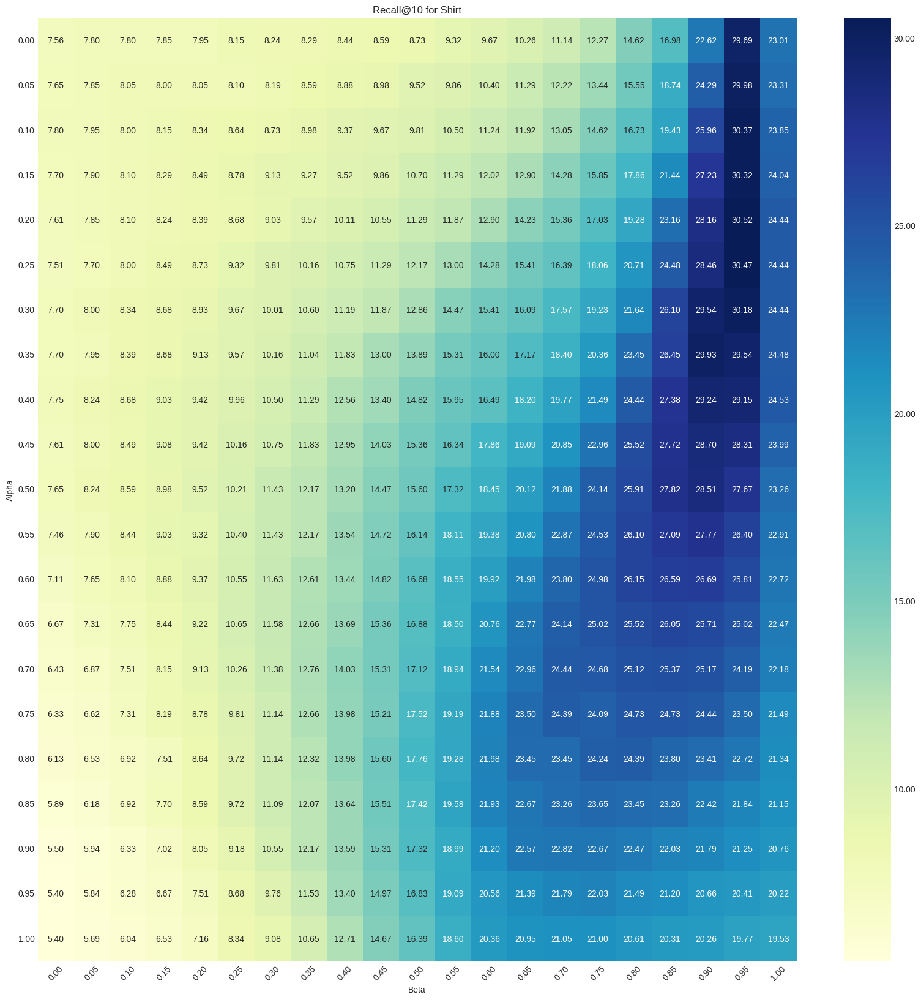

In [29]:
prepare_and_plot_recall_pivot(shirt_recall_at10, "Recall@10 for Shirt")

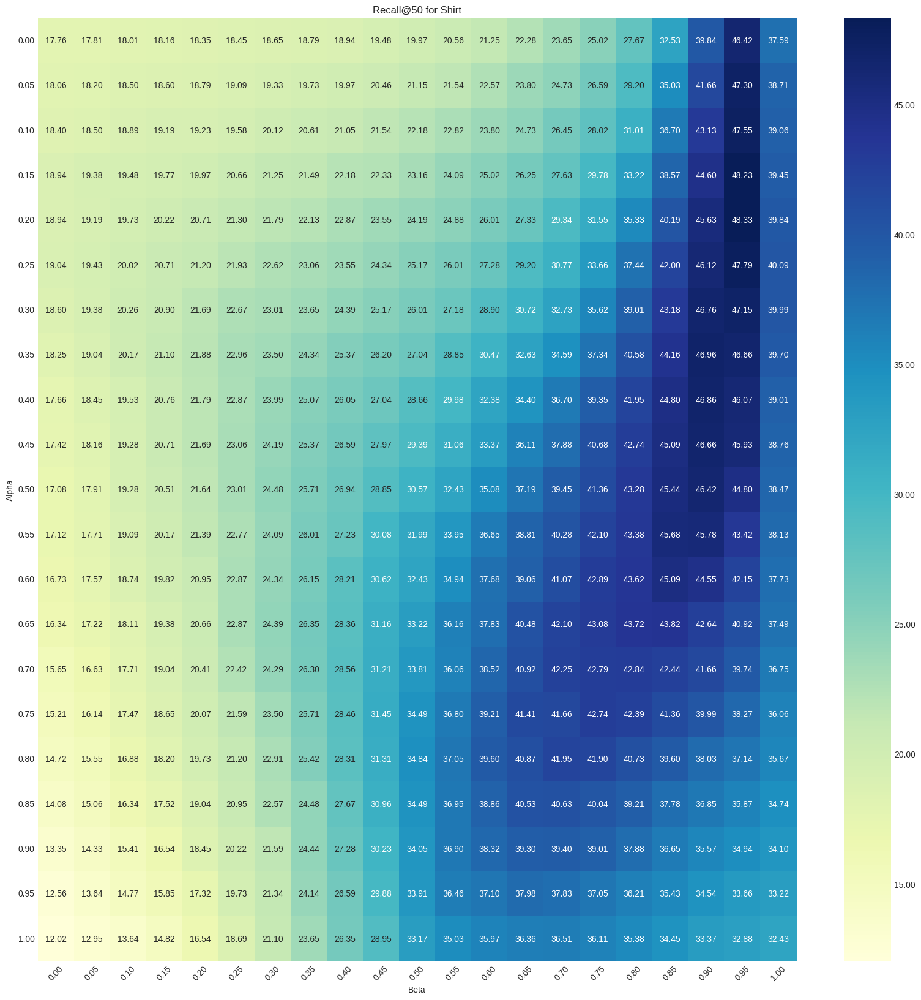

In [30]:
prepare_and_plot_recall_pivot(shirt_recall_at50, "Recall@50 for Shirt")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for Dress</div>

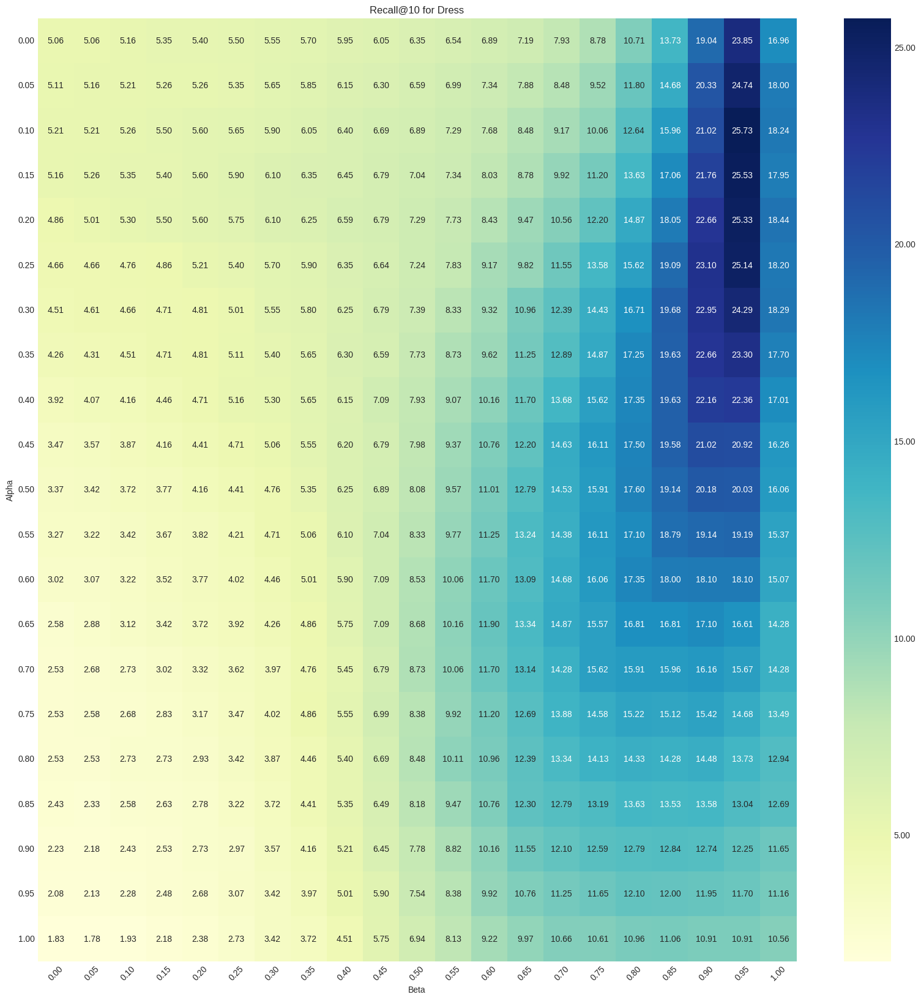

In [31]:
prepare_and_plot_recall_pivot(dress_recall_at10, "Recall@10 for Dress")

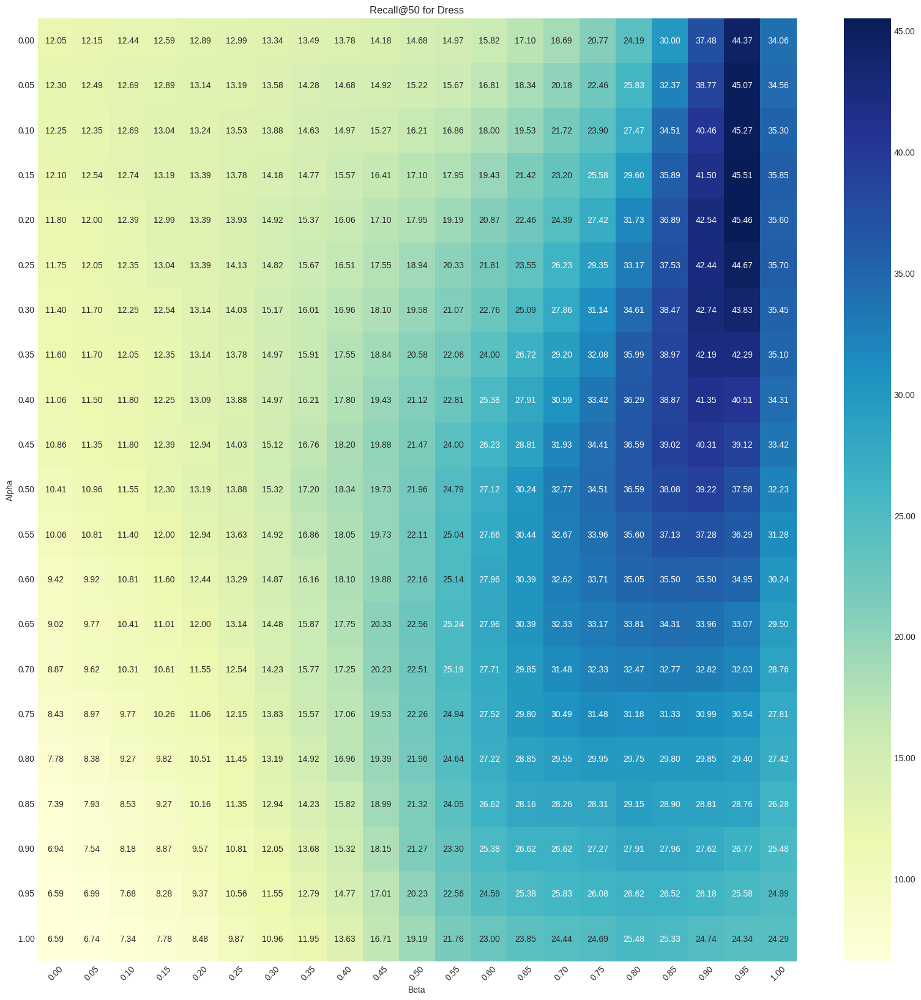

In [32]:
prepare_and_plot_recall_pivot(dress_recall_at50, "Recall@50 for Dress")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for TopTee</div>

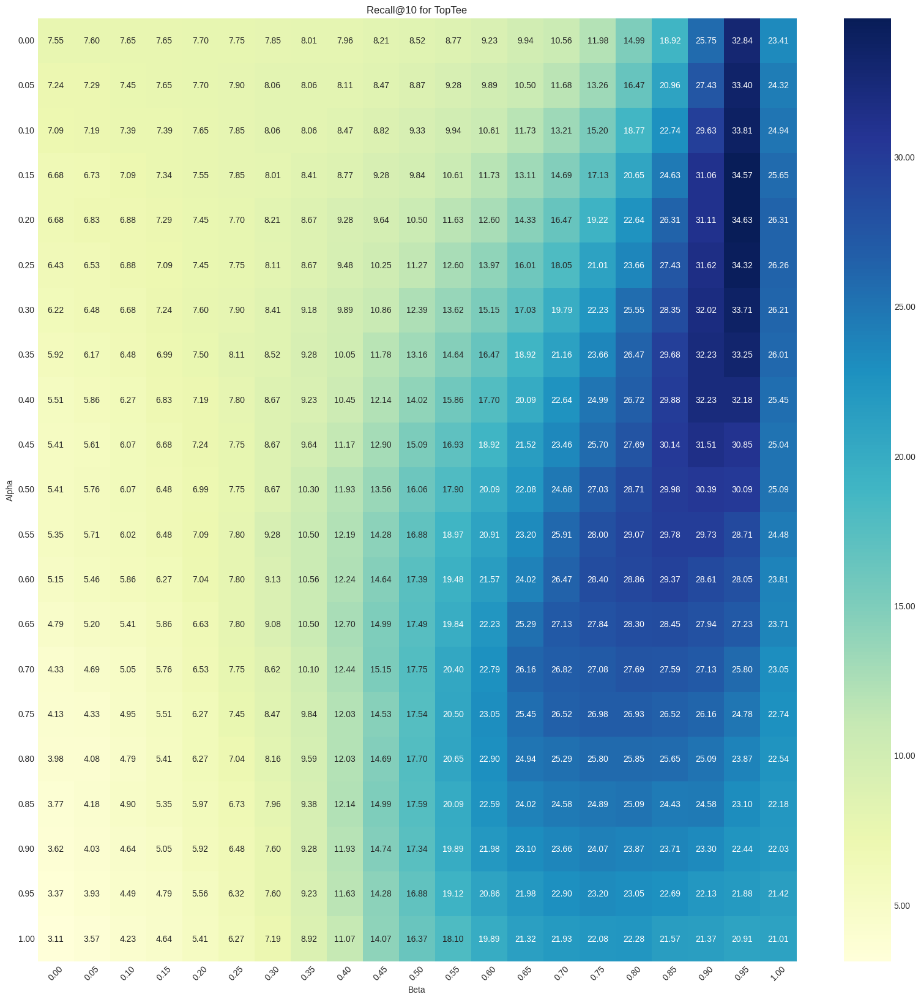

In [33]:
prepare_and_plot_recall_pivot(toptee_recall_at10, "Recall@10 for TopTee")

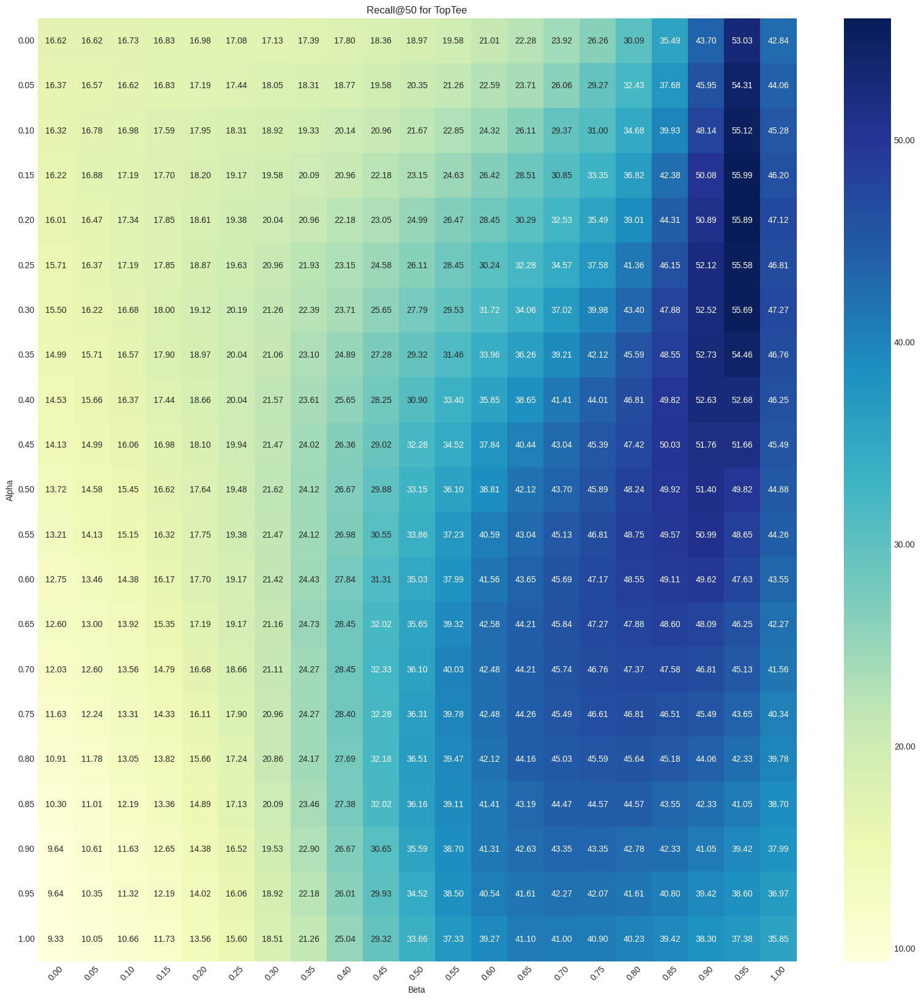

In [34]:
prepare_and_plot_recall_pivot(toptee_recall_at50, "Recall@50 for TopTee")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the average recall at 10 and 50 for all categories</div>

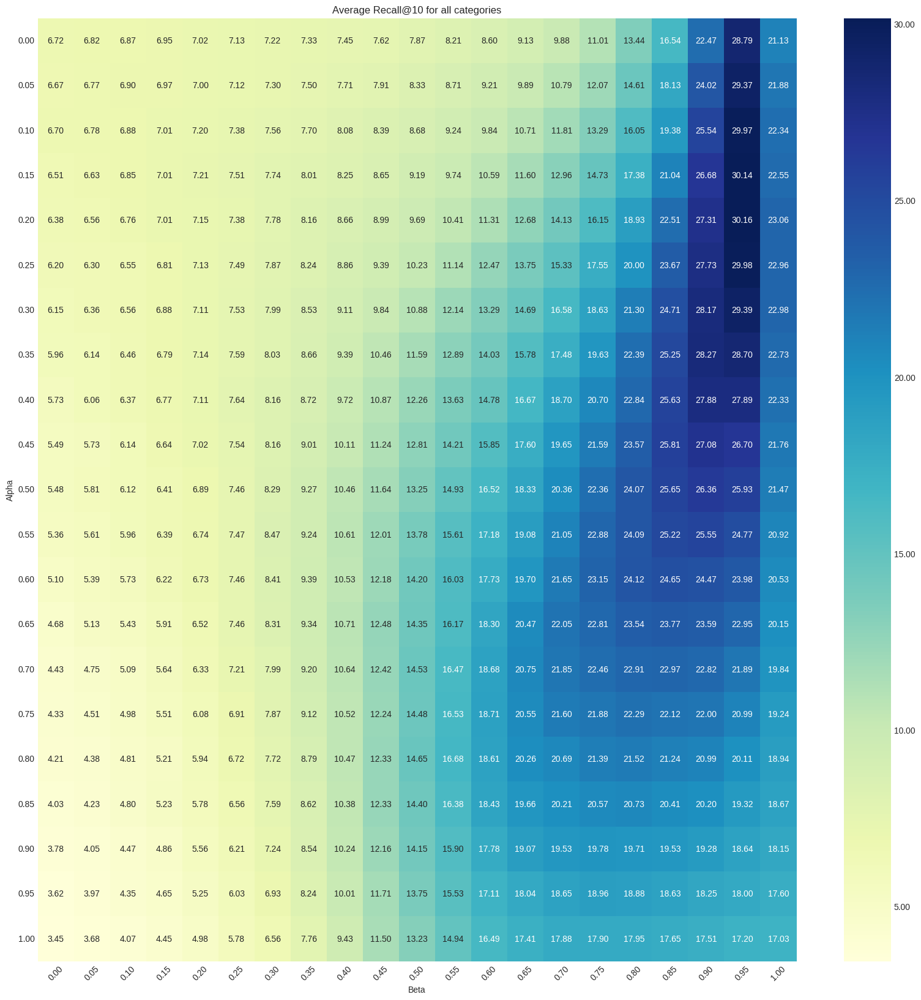

In [35]:
prepare_and_plot_recall_pivot(average_recall_at10, "Average Recall@10 for all categories")

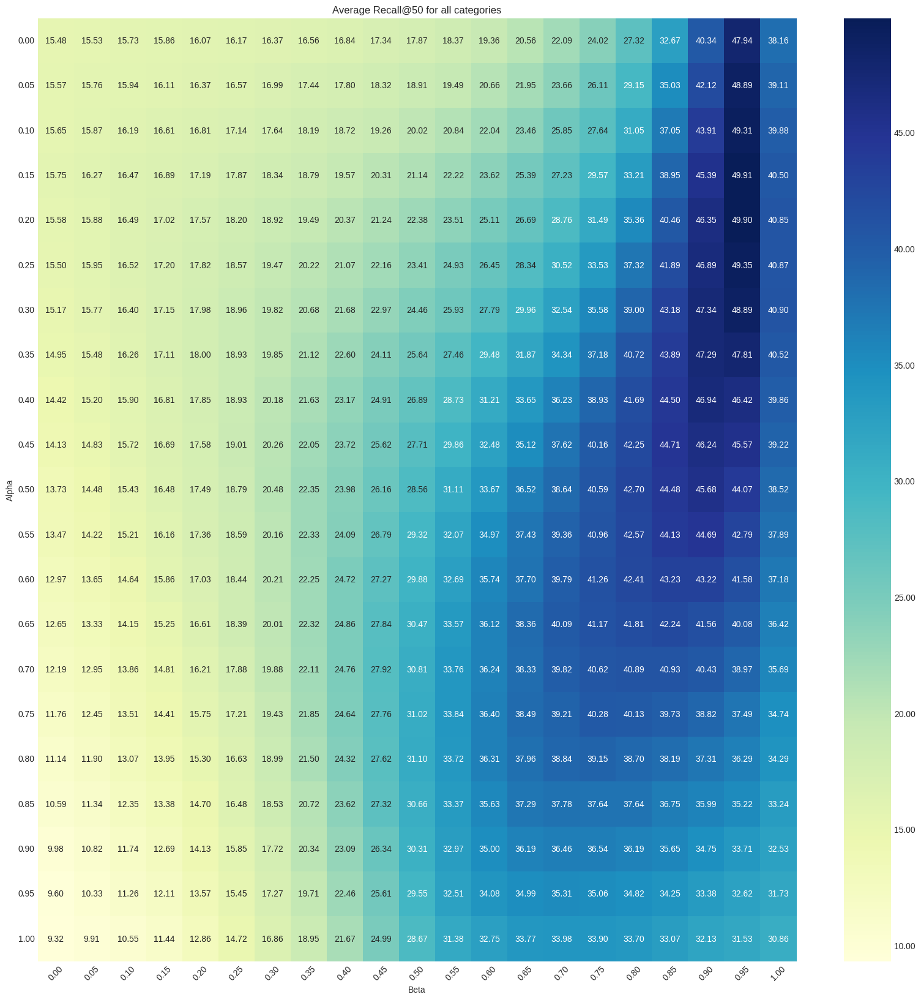

In [36]:
prepare_and_plot_recall_pivot(average_recall_at50, "Average Recall@50 for all categories")

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to compute the results</div>

In [37]:
def compute_results(
    dress_type: str,
    combining_function: callable,
    blip_text_encoder: torch.nn.Module,
    blip_img_encoder: torch.nn.Module,
    text_captions: List[dict],
    preprocess: callable,
    alpha: float = 0.65
)-> Tuple[torch.tensor, List[str], List[str]]:
    """
    View sample results on FashionIQ dataset combining text and image distances.
    
    :param dress_type: FashionIQ category on which perform the retrieval
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined features
    :param blip_text_encoder: BLIP text model
    :param blip_img_encoder: BLIP image model
    :param text_captions: text captions for the FashionIQ dataset
    :param preprocess: preprocess pipeline
    :param alpha: alpha value for combining text and image distances
    
    :return: [(image_path, text_caption, candidate_image_paths)]
    """
    blip_text_encoder = blip_text_encoder.float().eval()
    blip_img_encoder = blip_img_encoder.float().eval()
    
    # Define the validation datasets and extract the index features
    classic_val_dataset = FashionIQDataset('val', [dress_type], 'classic', preprocess)
    
    multiple_text_index_features, multiple_text_index_names = [], []
    
    for i in range(3):
        index_features, index_names, _ = extract_index_features_with_text_captions(
            classic_val_dataset,
            blip_text_encoder,
            text_captions,
            i + 1
        )
        multiple_text_index_features.append(index_features)
        multiple_text_index_names.append(index_names)
    
    image_index_features, image_index_names = extract_index_features(classic_val_dataset, blip_img_encoder)
    
    relative_val_dataset = FashionIQDataset('val', [dress_type], 'relative', preprocess)
    
    all_text_distances = []
    
    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, target_names = generate_fiq_val_predictions(blip_text_encoder, relative_val_dataset,
                                                                             combining_function, text_names,
                                                                             text_features)
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    predicted_image_features, target_names = generate_fiq_val_predictions(blip_text_encoder, relative_val_dataset,
                                                               combining_function, image_index_names,
                                                               image_index_features)

    # Normalize and compute distances
    image_index_features = F.normalize(image_index_features, dim=-1).float()
    image_distances = 1 - predicted_image_features @ image_index_features.T

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)
    
    merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances
    
    sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
    sorted_index_names = np.array(image_index_names if image_index_names else multiple_text_index_names[0])[sorted_indices]
    labels = torch.tensor(
        sorted_index_names == np.repeat(np.array(target_names), len(image_index_names if image_index_names else multiple_text_index_names[0])).reshape(len(target_names), -1))
    assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
    recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
    recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
    
    print(f"Recall at 10: {recall_at10}")
    print(f"Recall at 50: {recall_at50}")
        
    return sorted_indices, image_index_names, target_names

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Dress category</div>

In [38]:
sorted_indices_dress, image_index_names_dress, target_names_dress = compute_results(
    'dress',
    get_combing_function_with_beta(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0.2
)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.50it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 15:55:08.357219] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.87it/s]


[2024-05-12 15:55:09.532654] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.15it/s]


[2024-05-12 15:55:10.699537] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.98it/s]


[2024-05-12 15:55:11.892234] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.74it/s]


Recall at 10: 25.334656238555908

Recall at 50: 45.46355903148651

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Shirt category</div>

In [39]:
sorted_indices_shirt, image_index_names_shirt, target_names_shirt = compute_results(
    'shirt',
    get_combing_function_with_beta(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0.2
)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.50it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 15:56:57.561594] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.44it/s]


[2024-05-12 15:56:58.668538] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.40it/s]


[2024-05-12 15:56:59.792359] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.42it/s]


[2024-05-12 15:57:00.916513] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.01it/s]


Recall at 10: 30.52011728286743

Recall at 50: 48.33169877529144

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the TopTee category</div>

In [40]:
sorted_indices_toptee, image_index_names_toptee, target_names_toptee = compute_results(
    'toptee',
    get_combing_function_with_beta(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0.2
)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 15:58:34.002354] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.49it/s]


[2024-05-12 15:58:35.240240] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.75it/s]


[2024-05-12 15:58:36.341347] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.69it/s]


[2024-05-12 15:58:37.483251] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 52.97it/s]


Recall at 10: 34.6251904964447

Recall at 50: 55.88985085487366

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [41]:
def prepare_ground_truths(json_data):
    """
    Prepare ground truth data from the JSON structure.
    
    :param json_data: JSON data containing target and candidate matches with captions
    :return: Dictionary mapping targets to lists of tuples (candidates and captions)
    """
    ground_truths = {}
    for entry in json_data:
        target = entry['target']
        candidate = entry['candidate']
        captions = entry['captions']
        if target not in ground_truths:
            ground_truths[target] = []
        ground_truths[target].append((candidate, captions))  # Store as a tuple
    return ground_truths

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the retrieval results for a query</div>

In [42]:
def plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truths, top_k=5, i=0):
    """
    Plot retrieval results for a specific query showing the query and its top retrieved images, highlighting ground truths
    and displaying associated captions to the left of the query image.

    :param sorted_indices: 2D tensor or array with sorted indices of retrieved images per query.
    :param image_index_names: List of image paths corresponding to indices in sorted_indices.
    :param target_names: List of names or descriptions for each query.
    :param ground_truths: Dictionary mapping target names to lists of tuples (candidates and captions).
    :param top_k: Number of top retrieved results to display per query.
    :param i: Index of the query to display.
    """
    query_index = i
    retrival_result_images = [image_index_names[j] for j in sorted_indices[query_index]][:top_k]
    ground_truth_target = target_names[query_index]
    query_img_path, query_captions = ground_truths.get(ground_truth_target, [('', '')])[0]

    fig = plt.figure(figsize=(30, 5))
    gs = GridSpec(1, top_k + 2, figure=fig)
    query_img = Image.open(f'../fashionIQ_dataset/images/{query_img_path}.png')

    # Subplot for the caption text to the left of the query image
    ax_text = fig.add_subplot(gs[0, 0])
    query_name = query_img_path
    query_captions = '\n'.join(sentences for sentences in query_captions)
    ax_text.text(0.5, 0.5, query_captions, va='center', ha='center')
    ax_text.axis('off')

    # Subplot for the query image
    ax_image = fig.add_subplot(gs[0, 1])
    ax_image.imshow(query_img)
    ax_image.set_title(f"Query: {query_name}", color='blue')
    ax_image.axis('off')

    for j, img_path in enumerate(retrival_result_images):
        img = Image.open(f'../fashionIQ_dataset/images/{img_path}.png')

        ax_result = fig.add_subplot(gs[0, j + 2])
        ax_result.imshow(img)

        # Check if this image is a ground truth and retrieve its captions
        if img_path == ground_truth_target:
            ax_result.set_title(f"{img_path}", color='green')
        else:
            ax_result.set_title(img_path)

        ax_result.axis('off')

    plt.tight_layout()
    plt.show()

In [43]:
ground_truth_dress = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.dress.val.json')))
ground_truth_shirt = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.shirt.val.json')))
ground_truth_toptee = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.toptee.val.json')))

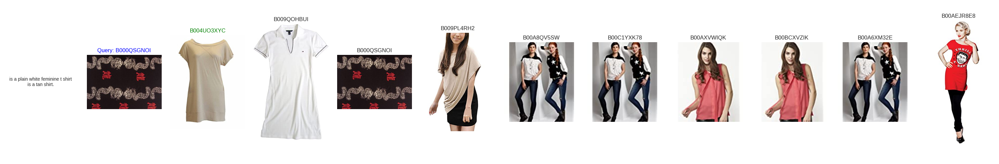

In [44]:
plot_retrieval_results_of_i(sorted_indices_dress, image_index_names_dress, target_names_dress, ground_truth_dress, top_k=10, i=3)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with alpha=0 (Same as the original BLIP4CIR)</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Dress category with alpha=0</div>

In [45]:
sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin = compute_results(
    'dress',
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.55it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 17:15:16.938365] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.47it/s]


[2024-05-12 17:15:18.249980] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.23it/s]


[2024-05-12 17:15:19.415698] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.42it/s]


[2024-05-12 17:15:20.577435] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.80it/s]


Recall at 10: 6.3460588455200195

Recall at 50: 14.675259590148926

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Shirt category with alpha=0</div>

In [46]:
sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin = compute_results(
    'shirt',
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.54it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 17:17:03.051992] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.16it/s]


[2024-05-12 17:17:04.201334] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.32it/s]


[2024-05-12 17:17:05.327209] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.48it/s]


[2024-05-12 17:17:06.449698] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.62it/s]


Recall at 10: 8.734052628278732

Recall at 50: 19.97056007385254

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the TopTee category with alpha=0</div>

In [47]:
sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin = compute_results(
    'toptee',
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.54it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 17:18:36.463673] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.91it/s]


[2024-05-12 17:18:37.691720] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.90it/s]


[2024-05-12 17:18:38.809229] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.88it/s]


[2024-05-12 17:18:39.910671] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.32it/s]


Recall at 10: 8.516063541173935

Recall at 50: 18.969912827014923

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [48]:
def found_better_than_original(
        sorted_indices_origin, image_index_names_origin, target_names_origin,
        sorted_indices, image_index_names, target_names, top_k=10
) -> List[int]:
    """
    Return indices of queries where the new retrieval results are better than the original results based on the rank
    of the ground truth in the top_k results.

    Args:
        sorted_indices_origin (np.ndarray): 2D array of sorted indices by relevance per query for the original method.
        image_index_names_origin (List[str]): List of image names corresponding to indices in sorted_indices_origin.
        target_names_origin (List[str]): List of names or descriptions for each query for the original method.
        sorted_indices (np.ndarray): 2D array of sorted indices by relevance per query for the new method.
        image_index_names (List[str]): List of image names corresponding to indices in sorted_indices.
        target_names (List[str]): List of target names each query is supposed to retrieve.
        top_k (int): Number of top retrieved results to consider per query.

    Returns:
        List[int]: List of indices where the new method outperforms the original method in terms of the rank of the
        ground truth target.
    """
    better_indices = []
    total_queries = len(target_names)  # Assuming the same number of queries for both sets

    for index in range(total_queries):
        # Find the index of the ground truth in the top_k results of the original method
        new_rank = [image_index_names[i] for i in sorted_indices[index]].index(target_names[index])
        origin_rank = [image_index_names_origin[i] for i in sorted_indices_origin[index]].index(target_names_origin[index])

        if new_rank <= top_k < origin_rank:
            better_indices.append(index)

    return better_indices

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Dress category</div>

In [49]:
become_better = found_better_than_original(
    sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin,
    sorted_indices_dress, image_index_names_dress, target_names_dress,
    top_k=10
)

len(become_better), become_better[:10]

(455, [0, 1, 3, 10, 11, 12, 16, 19, 27, 33])

In [50]:
become_worse = found_better_than_original(
    sorted_indices_dress, image_index_names_dress, target_names_dress,
    sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(54, [6, 13, 109, 169, 215, 218, 262, 352, 459, 496])

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Shirt category</div>

In [51]:
become_better = found_better_than_original(
    sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin,
    sorted_indices_shirt, image_index_names_shirt, target_names_shirt,
    top_k=10
)

len(become_better), become_better[:10]

(520, [1, 6, 8, 11, 13, 16, 19, 20, 21, 24])

In [52]:
become_worse = found_better_than_original(
    sorted_indices_shirt, image_index_names_shirt, target_names_shirt,
    sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(77, [10, 84, 117, 150, 183, 187, 195, 222, 258, 263])

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the TopTee category</div>

In [53]:
become_better = found_better_than_original(
    sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin,
    sorted_indices_toptee, image_index_names_toptee, target_names_toptee,
    top_k=10
)

len(become_better), become_better[:10]

(582, [2, 4, 7, 9, 17, 18, 20, 24, 25, 28])

In [54]:
become_worse = found_better_than_original(
    sorted_indices_toptee, image_index_names_toptee, target_names_toptee,
    sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(59, [32, 44, 101, 117, 128, 170, 176, 216, 230, 241])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the Dress category</div>

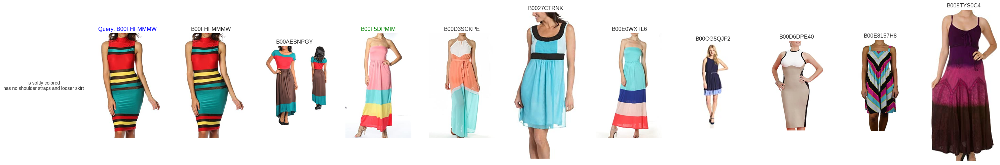

In [55]:
plot_retrieval_results_of_i(sorted_indices_dress, image_index_names_dress, target_names_dress, ground_truth_dress, top_k=10, i=11)

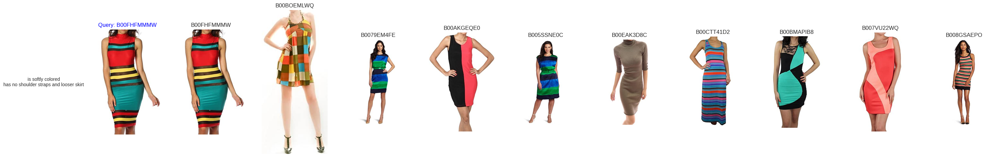

In [56]:
plot_retrieval_results_of_i(sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin, ground_truth_dress, top_k=10, i=11)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the Shirt category</div>

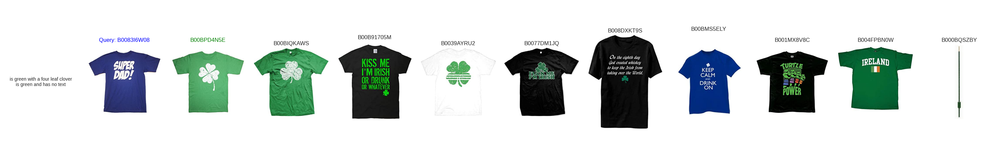

In [57]:
plot_retrieval_results_of_i(sorted_indices_shirt, image_index_names_shirt, target_names_shirt, ground_truth_shirt, top_k=10, i=1)

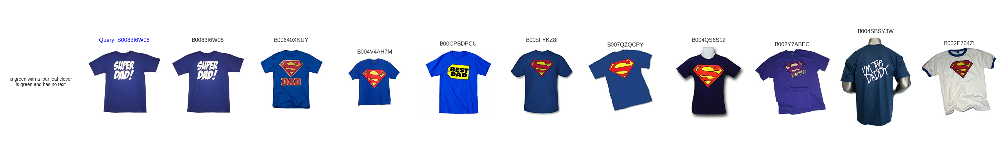

In [58]:
plot_retrieval_results_of_i(sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin, ground_truth_shirt, top_k=10, i=1)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the TopTee category</div>

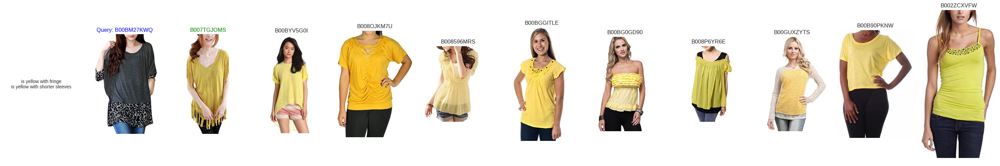

In [59]:
plot_retrieval_results_of_i(sorted_indices_toptee, image_index_names_toptee, target_names_toptee, ground_truth_toptee, top_k=10, i=2)

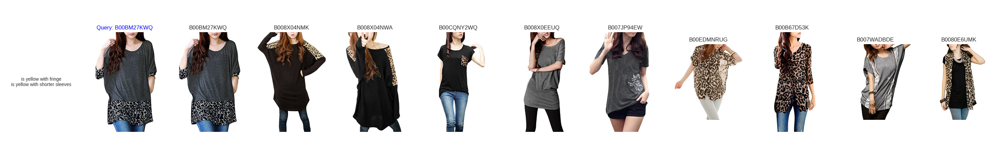

In [60]:
plot_retrieval_results_of_i(sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin, ground_truth_toptee, top_k=10, i=2)